In [1]:
# !pip install darts
# !pip install pyyaml==5.4.1
# !pip install matplotlib==3.1.1

In [72]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import numpy as np
import pandas as pd
from tqdm import tqdm_notebook as tqdm

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import os
import sys
import missingno as mno

from darts import TimeSeries, concatenate
from darts.dataprocessing.transformers import Scaler
from darts.models import TFTModel, TransformerModel, RNNModel, BlockRNNModel
from darts.metrics import mape, rmse, mse, mae
from darts.utils.statistics import check_seasonality, plot_acf
from darts.datasets import AirPassengersDataset, IceCreamHeaterDataset
from darts.utils.timeseries_generation import datetime_attribute_timeseries
from darts.utils.likelihood_models import QuantileRegression
from darts.utils.utils import retain_period_common_to_all

import torch
import torch.nn as nn

import warnings

warnings.filterwarnings("ignore")
import logging

logging.disable(logging.CRITICAL)

import shap

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [73]:
# before starting, we define some constants
num_samples = 100

figsize = (9, 6)
lowest_q, low_q, high_q, highest_q = 0.01, 0.1, 0.9, 0.99
label_q_outer = f"{int(lowest_q * 100)}-{int(highest_q * 100)}th percentiles"
label_q_inner = f"{int(low_q * 100)}-{int(high_q * 100)}th percentiles"

In [74]:
fin_data = pd.read_csv("Data_Template.csv", index_col=0).reset_index()
print(fin_data.columns)

DJ = fin_data.drop(columns=['SPY'])
SP = fin_data[['Date', 'SPY']] #fin_data.drop(columns=['DJ'])

# DJ = TimeSeries.from_dataframe(DJ, time_col='Date') 
# SP = TimeSeries.from_dataframe(SP, time_col='Date') 
# fin_data = TimeSeries.from_dataframe(fin_data, time_col='Date') 

Index(['Date', 'SPY', 'DJ', 'CPI', 'PPI', 'Real GDP', 'Industrial Production',
       'Balance of Trade', 'M1', 'Housing Starts', 'Employment Report',
       'Treasury Yields'],
      dtype='object')


In [75]:
SP

,Date,SPY
0,31/12/2020,3756.07
1,30/11/2020,3621.63
2,31/10/2020,3269.96
3,30/9/2020,3363.00
4,31/8/2020,3500.31
...,...,...
343,31/5/1992,415.35
344,30/4/1992,414.95
345,31/3/1992,403.69
346,29/2/1992,412.70


In [76]:
SP_ts = TimeSeries.from_dataframe(SP, time_col='Date') 

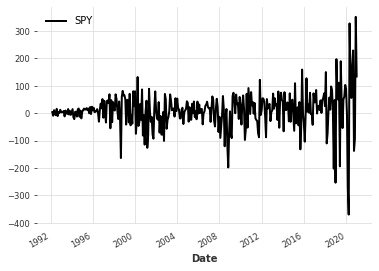

In [77]:
SP_ts.diff().plot()

In [78]:
SP_ts.slice(pd.Timestamp(2018, 1, 1,),pd.Timestamp(2019, 12, 31,))

<TimeSeries (DataArray) (Date: 24, component: 1, sample: 1)>
array([[[2823.81]],

       [[2713.83]],

       [[2640.87]],

       [[2648.05]],

       [[2705.27]],

       [[2718.37]],

       [[2816.29]],

       [[2901.52]],

       [[2913.98]],

       [[2711.74]],

...

       [[2834.4 ]],

       [[2945.83]],

       [[2752.06]],

       [[2941.76]],

       [[2980.38]],

       [[2926.46]],

       [[2976.74]],

       [[3037.56]],

       [[3140.98]],

       [[3230.78]]])
Coordinates:
  * Date       (Date) datetime64[ns] 2018-01-31 2018-02-28 ... 2019-12-31
  * component  (component) object 'SPY'
Dimensions without coordinates: sample

## Transformer (S&P500)

In [9]:
# Read data
series = SP_ts # .diff()

# we convert monthly number of passengers to average daily number of passengers per month
# series = series / TimeSeries.from_series(series.time_index.days_in_month)
# series = series.astype(np.float32)

# Create training and validation sets:
training_cutoff = pd.Timestamp("20171231")
train, val = series.split_after(training_cutoff)

# Normalize the time series (note: we avoid fitting the transformer on the validation set)
transformer_sp = Scaler()
train_transformed = transformer_sp.fit_transform(train)
val_transformed = transformer_sp.transform(val)
series_transformed = transformer_sp.transform(series)


In [10]:
# create year, month and integer index covariate series
covariates = datetime_attribute_timeseries(series, attribute="year", one_hot=False)
covariates = covariates.stack(
    datetime_attribute_timeseries(series, attribute="month", one_hot=False)
)
covariates = covariates.stack(
    TimeSeries.from_times_and_values(
        times=series.time_index,
        values=np.arange(len(series)),
        columns=["linear_increase"],
    )
)
covariates = covariates.astype(np.float32)

In [11]:
# transform covariates (note: we fit the transformer on train split and can then transform the entire covariates series)
scaler_covs = Scaler()
cov_train, cov_val = covariates.split_after(training_cutoff)
scaler_covs.fit(cov_train)
covariates_transformed = scaler_covs.transform(covariates)

In [12]:
LOAD = False         # True = load previously saved model from disk?  False = (re)train the model
SAVE = "\_TForm_model10e.pth.tar"   # file name to save the model under

EPOCHS = 200
INLEN =  24 # 32 #36          # input size
FEAT = 64           # d_model = number of expected features in the inputs, up to 512    
HEADS = 4           # default 8
ENCODE = 6          # encoder layers
DECODE = 6          # decoder layers
DIM_FF = 256        # dimensions of the feedforward network, default 2048
BATCH = 16           # batch size
ACTF = "relu"       # activation function, relu (default) or gelu
SCHLEARN = None     # a PyTorch learning rate scheduler; None = constant rate
LEARN = 1e-3        # learning rate
VALWAIT = 1         # epochs to wait before evaluating the loss on the test/validation set
DROPOUT = 0.1       # dropout rate
N_FC = 3            # output size

RAND = 23           # random seed
N_SAMPLES = 100     # number of times a prediction is sampled from a probabilistic model
N_JOBS = -1          # parallel processors to use;  -1 = all processors

# default quantiles for QuantileRegression
QUANTILES = [
    0.01,
    0.05,
    0.1,
    0.15,
    0.2,
    0.25,
    0.3,
    0.4,
    0.5,
    0.6,
    0.7,
    0.75,
    0.8,
    0.85,
    0.9,
    0.95,
    0.99,
]

SPLIT = 0.9         # train/test %

FIGSIZE = (9, 6)


qL1, qL2 = 0.01, 0.10        # percentiles of predictions: lower bounds
qU1, qU2 = 1-qL1, 1-qL2,     # upper bounds derived from lower bounds
label_q1 = f'{int(qU1 * 100)} / {int(qL1 * 100)} percentile band'
label_q2 = f'{int(qU2 * 100)} / {int(qL2 * 100)} percentile band'

mpath = os.path.abspath(os.getcwd()) + SAVE     # path and file name to save the model

In [13]:
SP_baseline_model = TransformerModel(
                    input_chunk_length = INLEN,
                    output_chunk_length = N_FC,
                    batch_size = BATCH,
                    n_epochs = EPOCHS,
                    model_name = "Transformer_Univarite_SP",
                    nr_epochs_val_period = VALWAIT,
                    d_model = FEAT,
                    nhead = HEADS,
                    num_encoder_layers = ENCODE,
                    num_decoder_layers = DECODE,
                    dim_feedforward = DIM_FF,
                    dropout = DROPOUT,
                    activation = ACTF,
                    random_state=RAND,
                    likelihood=QuantileRegression(quantiles=QUANTILES), 
                    optimizer_kwargs={'lr': LEARN},
                    # add_encoders={"cyclic": {"future": ["month"]}},
                    save_checkpoints=True,
                    force_reset=True,
                    torch_device_str="cuda"
                    )

In [14]:
# default quantiles for QuantileRegression
# quantiles = [
#     0.01,
#     0.05,
#     0.1,
#     0.15,
#     0.2,
#     0.25,
#     0.3,
#     0.4,
#     0.5,
#     0.6,
#     0.7,
#     0.75,
#     0.8,
#     0.85,
#     0.9,
#     0.95,
#     0.99,
# ]
# input_chunk_length = 24
# forecast_horizon = 3


# SP_baseline_model = TFTModel(
#     input_chunk_length=input_chunk_length,
#     output_chunk_length=forecast_horizon,
#     model_name = "TST_Model_Univariate_DowJones",
#     hidden_size=64,
#     lstm_layers=1,
#     num_attention_heads=4,
#     dropout=0.1,
#     batch_size=16,
#     n_epochs=200,
#     add_relative_index=False,
#     add_encoders={"cyclic": {"future": ["month"]}},
#     likelihood=QuantileRegression(
#         quantiles=quantiles
#     ),  # QuantileRegression is set per default
#     # loss_fn=nn.MSELoss(),
#     random_state=23,
#     save_checkpoints=True,
#     force_reset=True,
#     torch_device_str="cuda"
# )

In [15]:
SP_baseline_model.fit(train_transformed, 
            #  future_covariates=covariates_transformed, 
             verbose=True)

Training: 0it [00:00, ?it/s]

Predicting: 18it [00:00, ?it/s]

MAPE: 14.82% 
 MSE: 294326.00 
 MAE: 461.07 
 Precision Error(PM): 3.48


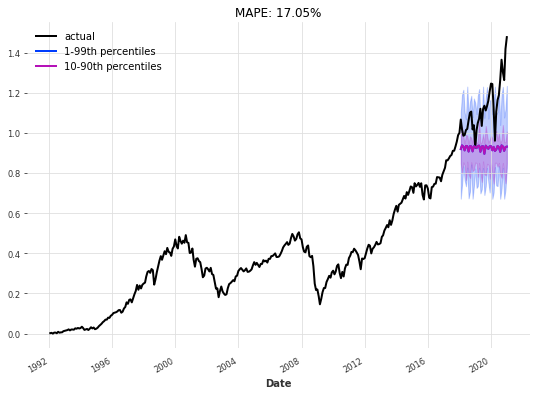

In [16]:

def eval_model(model, n, actual_series, val_series, transformer):
    pred_series = model.predict(n=n, num_samples=num_samples)

    # plot actual series
    plt.figure(figsize=figsize)
    actual_series[: pred_series.end_time()].plot(label="actual")

    # plot prediction with quantile ranges
    pred_series.plot(
        low_quantile=lowest_q, high_quantile=highest_q, label=label_q_outer
    )
    pred_series.plot(low_quantile=low_q, high_quantile=high_q, label=label_q_inner)
    
    plt.title("MAPE: {:.2f}%".format(mape(val_series, pred_series)))
    plt.legend()
    # print(pred_series.quantile_timeseries(0.5))

    print("MAPE: {:.2f}% \n".format(
            mape(
                transformer.inverse_transform(val_series),
                transformer.inverse_transform(pred_series)
              )
        ),
        "MSE: {:.2f} \n".format(
            mse(transformer.inverse_transform(val_series),
                transformer.inverse_transform(pred_series)
              )
        ),
        "MAE: {:.2f} \n".format(
            mae(transformer.inverse_transform(val_series),
                transformer.inverse_transform(pred_series)
            )
        ),
        "Precision Error(PM): {:.2f}".format(
          mse(
                transformer.inverse_transform(val_series),
                transformer.inverse_transform(pred_series),
            ) / transformer.inverse_transform(val_series).pd_series().std()**2
        )
    )


eval_model(SP_baseline_model, 36, series_transformed, val_transformed, transformer_sp)

In [18]:
forecast_horizon = 3
backtest_series = SP_baseline_model.historical_forecasts(
    series_transformed,
    # future_covariates=covariates_transformed,
    start=train.end_time() + train.freq,
    num_samples=num_samples,
    forecast_horizon=forecast_horizon,
    stride=forecast_horizon,
    last_points_only=False,
    retrain=False,
    verbose=True, 
    overlap_end=False
)

  0%|          | 0/12 [00:00<?, ?it/s]

Predicting: 18it [00:00, ?it/s]

  8%|▊         | 1/12 [00:00<00:02,  4.05it/s]

Predicting: 18it [00:00, ?it/s]

 17%|█▋        | 2/12 [00:00<00:02,  4.07it/s]

Predicting: 18it [00:00, ?it/s]

 25%|██▌       | 3/12 [00:00<00:02,  4.03it/s]

Predicting: 18it [00:00, ?it/s]

 33%|███▎      | 4/12 [00:00<00:01,  4.14it/s]

Predicting: 18it [00:00, ?it/s]

 42%|████▏     | 5/12 [00:01<00:01,  4.27it/s]

Predicting: 18it [00:00, ?it/s]

 50%|█████     | 6/12 [00:01<00:01,  4.30it/s]

Predicting: 18it [00:00, ?it/s]

 58%|█████▊    | 7/12 [00:01<00:01,  4.33it/s]

Predicting: 18it [00:00, ?it/s]

 67%|██████▋   | 8/12 [00:01<00:00,  4.35it/s]

Predicting: 18it [00:00, ?it/s]

 75%|███████▌  | 9/12 [00:02<00:00,  4.40it/s]

Predicting: 18it [00:00, ?it/s]

 83%|████████▎ | 10/12 [00:02<00:00,  4.40it/s]

Predicting: 18it [00:00, ?it/s]

 92%|█████████▏| 11/12 [00:02<00:00,  4.44it/s]

Predicting: 18it [00:00, ?it/s]

100%|██████████| 12/12 [00:02<00:00,  4.32it/s]


In [19]:
def eval_backtest(backtest_series, actual_series, horizon, start, transformer):
    plt.figure(figsize=figsize)
    actual_series.plot(label="actual")
    backtest_series.plot(
        low_quantile=lowest_q, high_quantile=highest_q, label=label_q_outer
    )
    # print(retain_period_common_to_all([transformer.inverse_transform(actual_series),
    #             transformer.inverse_transform(backtest_series)])[0].pd_series().std())
    backtest_series.plot(low_quantile=low_q, high_quantile=high_q, label=label_q_inner)
    plt.legend()
    plt.title(f"Backtest, starting {start}, {horizon}-months horizon")
    print(
        "MAPE: {:.4f}% \n".format(
            mape(
                transformer.inverse_transform(actual_series),
                transformer.inverse_transform(backtest_series),
            )
        ),
        "MSE: {:.4f} \n".format(
            mse(
                transformer.inverse_transform(actual_series),
                transformer.inverse_transform(backtest_series),
            )
        ),
        "MAE: {:.4f} \n".format(
            mae(
                transformer.inverse_transform(actual_series),
                transformer.inverse_transform(backtest_series),
            )
        ),
        "Precision Error(PM): {:.4f}".format(
            mse(
                transformer.inverse_transform(actual_series),
                transformer.inverse_transform(backtest_series),
            ) / retain_period_common_to_all([transformer.inverse_transform(actual_series),
                transformer.inverse_transform(backtest_series)])[0].pd_series().std()**2
        )
    )
    
    print(
        "Pre-covid MAPE: {:.4f}% \n".format(
            mape(
                transformer.inverse_transform(actual_series).slice(pd.Timestamp(2018, 1, 1,),pd.Timestamp(2019, 12, 31,)),
                transformer.inverse_transform(backtest_series).slice(pd.Timestamp(2018, 1, 1,),pd.Timestamp(2019, 12, 31,)),
            )
        ),
        "Pre-covid MSE: {:.4f} \n".format(
            mse(
                transformer.inverse_transform(actual_series).slice(pd.Timestamp(2018, 1, 1,),pd.Timestamp(2019, 12, 31,)),
                transformer.inverse_transform(backtest_series).slice(pd.Timestamp(2018, 1, 1,),pd.Timestamp(2019, 12, 31,)),
            )
        ),
        "Pre-covid MAE: {:.4f} \n".format(
            mae(
                transformer.inverse_transform(actual_series).slice(pd.Timestamp(2018, 1, 1,),pd.Timestamp(2019, 12, 31,)),
                transformer.inverse_transform(backtest_series).slice(pd.Timestamp(2018, 1, 1,),pd.Timestamp(2019, 12, 31,)),
            )
        ),
        "Pre-covid Precision Error(PM): {:.4f}".format(
            mse(
                transformer.inverse_transform(actual_series).slice(pd.Timestamp(2018, 1, 1,),pd.Timestamp(2019, 12, 31,)),
                transformer.inverse_transform(backtest_series).slice(pd.Timestamp(2018, 1, 1,),pd.Timestamp(2019, 12, 31,)),
            ) / retain_period_common_to_all([transformer.inverse_transform(actual_series),
                transformer.inverse_transform(backtest_series)])[0].slice(pd.Timestamp(2018, 1, 1,),pd.Timestamp(2019, 12, 31,)).pd_series().std()**2
        )
    )

    print(
        "Post-covid MAPE: {:.4f}% \n".format(
            mape(
                transformer.inverse_transform(actual_series).slice(pd.Timestamp(2020, 1, 1,),pd.Timestamp(2022, 12, 31,)),
                transformer.inverse_transform(backtest_series).slice(pd.Timestamp(2020, 1, 1,),pd.Timestamp(2022, 12, 31,)),
            )
        ),
        "Post-covid MSE: {:.4f} \n".format(
            mse(
                transformer.inverse_transform(actual_series).slice(pd.Timestamp(2020, 1, 1,),pd.Timestamp(2022, 12, 31,)),
                transformer.inverse_transform(backtest_series).slice(pd.Timestamp(2020, 1, 1,),pd.Timestamp(2022, 12, 31,)),
            )
        ),
        "Post-covid MAE: {:.4f} \n".format(
            mae(
                transformer.inverse_transform(actual_series).slice(pd.Timestamp(2020, 1, 1,),pd.Timestamp(2022, 12, 31,)),
                transformer.inverse_transform(backtest_series).slice(pd.Timestamp(2020, 1, 1,),pd.Timestamp(2022, 12, 31,)),
            )
        ),
        "Post-covid Precision Error(PM): {:.4f}".format(
            mse(
                transformer.inverse_transform(actual_series).slice(pd.Timestamp(2020, 1, 1,),pd.Timestamp(2022, 12, 31,)),
                transformer.inverse_transform(backtest_series).slice(pd.Timestamp(2020, 1, 1,),pd.Timestamp(2022, 12, 31,)),
            ) / retain_period_common_to_all([transformer.inverse_transform(actual_series),
                transformer.inverse_transform(backtest_series)])[0].slice(pd.Timestamp(2020, 1, 1,),pd.Timestamp(2022, 12, 31,)).pd_series().std()**2
        )
    )

MAPE: 14.6744% 
 MSE: 291030.5800 
 MAE: 456.9916 
 Precision Error(PM): 3.4378
Pre-covid MAPE: 11.3821% 
 Pre-covid MSE: 137118.0861 
 Pre-covid MAE: 331.2657 
 Pre-covid Precision Error(PM): 4.8649
Post-covid MAPE: 21.2592% 
 Post-covid MSE: 598855.5677 
 Post-covid MAE: 708.4435 
 Post-covid Precision Error(PM): 5.6452


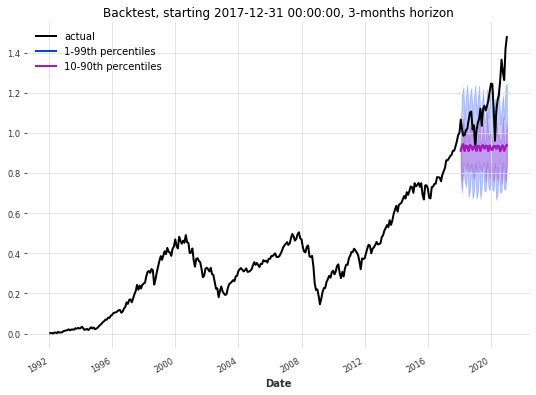

In [20]:

eval_backtest(
    backtest_series=concatenate(backtest_series),
    actual_series=series_transformed,
    horizon=forecast_horizon,
    start=training_cutoff,
    transformer=transformer_sp,
)

In [21]:
# SP_baseline_model.model_params

## LSTM (SP)

In [22]:
quantiles = [
    0.01,
    0.05,
    0.1,
    0.15,
    0.2,
    0.25,
    0.3,
    0.4,
    0.5,
    0.6,
    0.7,
    0.75,
    0.8,
    0.85,
    0.9,
    0.95,
    0.99,
]

lstm_model = RNNModel(
    model="LSTM",
    hidden_dim=64,
    dropout=0.1,
    batch_size=16,
    n_epochs=200,
    optimizer_kwargs={"lr": 1e-3},
    model_name="LSTM_Univariate",
    log_tensorboard=True,
    random_state=23,
    training_length=27,
    input_chunk_length=24,
    force_reset=True,
    save_checkpoints=True,
    likelihood=QuantileRegression(
        quantiles=quantiles
    )
)

In [23]:
lstm_model.fit(
    train_transformed,
    future_covariates=covariates_transformed,
    val_series=val_transformed,
    val_future_covariates=covariates_transformed,
    verbose=True,
)

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Predicting: 18it [00:00, ?it/s]

MAPE: 8.09% 
 MSE: 107830.95 
 MAE: 254.82 
 Precision Error(PM): 1.27


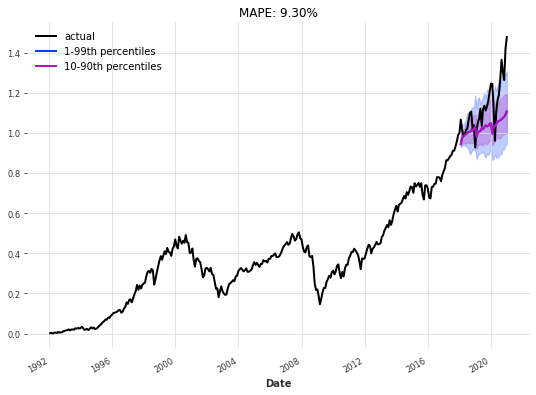

In [24]:

eval_model(lstm_model, 36, series_transformed, val_transformed, transformer_sp)


  0%|          | 0/12 [00:00<?, ?it/s]

Predicting: 18it [00:00, ?it/s]

  8%|▊         | 1/12 [00:00<00:01,  9.21it/s]

Predicting: 18it [00:00, ?it/s]

 17%|█▋        | 2/12 [00:00<00:01,  8.22it/s]

Predicting: 18it [00:00, ?it/s]

 25%|██▌       | 3/12 [00:00<00:01,  8.63it/s]

Predicting: 18it [00:00, ?it/s]

 33%|███▎      | 4/12 [00:00<00:00,  8.70it/s]

Predicting: 18it [00:00, ?it/s]

 42%|████▏     | 5/12 [00:00<00:00,  8.96it/s]

Predicting: 18it [00:00, ?it/s]

 50%|█████     | 6/12 [00:00<00:00,  8.99it/s]

Predicting: 18it [00:00, ?it/s]

 58%|█████▊    | 7/12 [00:00<00:00,  9.13it/s]

Predicting: 18it [00:00, ?it/s]

 67%|██████▋   | 8/12 [00:00<00:00,  9.10it/s]

Predicting: 18it [00:00, ?it/s]

 75%|███████▌  | 9/12 [00:01<00:00,  8.84it/s]

Predicting: 18it [00:00, ?it/s]

 83%|████████▎ | 10/12 [00:01<00:00,  8.85it/s]

Predicting: 18it [00:00, ?it/s]

 92%|█████████▏| 11/12 [00:01<00:00,  8.81it/s]

Predicting: 18it [00:00, ?it/s]

100%|██████████| 12/12 [00:01<00:00,  8.81it/s]


MAPE: 6.1968% 
 MSE: 50679.1894 
 MAE: 184.6509 
 Precision Error(PM): 0.5987
Pre-covid MAPE: 5.0693% 
 Pre-covid MSE: 30887.0574 
 Pre-covid MAE: 142.9024 
 Pre-covid Precision Error(PM): 1.0959
Post-covid MAPE: 8.4516% 
 Post-covid MSE: 90263.4535 
 Post-covid MAE: 268.1480 
 Post-covid Precision Error(PM): 0.8509


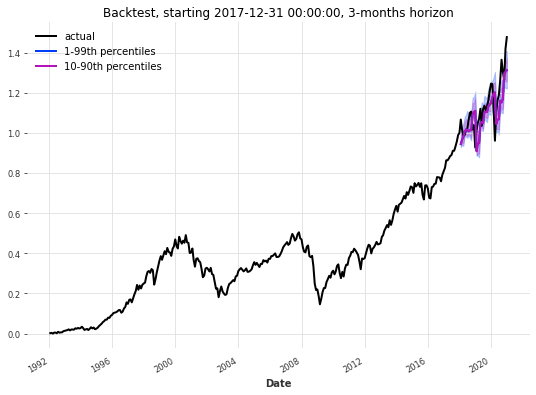

In [25]:

forecast_horizon= 3
last_points_only = False
backtest_series = lstm_model.historical_forecasts(
    series_transformed,
    # past_covariates=past_covariates_transformed,
    future_covariates=covariates_transformed,
    num_samples=num_samples,
    start=train.end_time() + train.freq,
    forecast_horizon=forecast_horizon,
    stride=1 if last_points_only else forecast_horizon,
    retrain=False,
    last_points_only=last_points_only,
    overlap_end=True,
    verbose=True,
)

eval_backtest(
    backtest_series=concatenate(backtest_series),
    actual_series=series_transformed,
    horizon=forecast_horizon,
    start=training_cutoff,
    transformer=transformer_sp,
)

## Transformer (DowJones)

### Feature Engineering

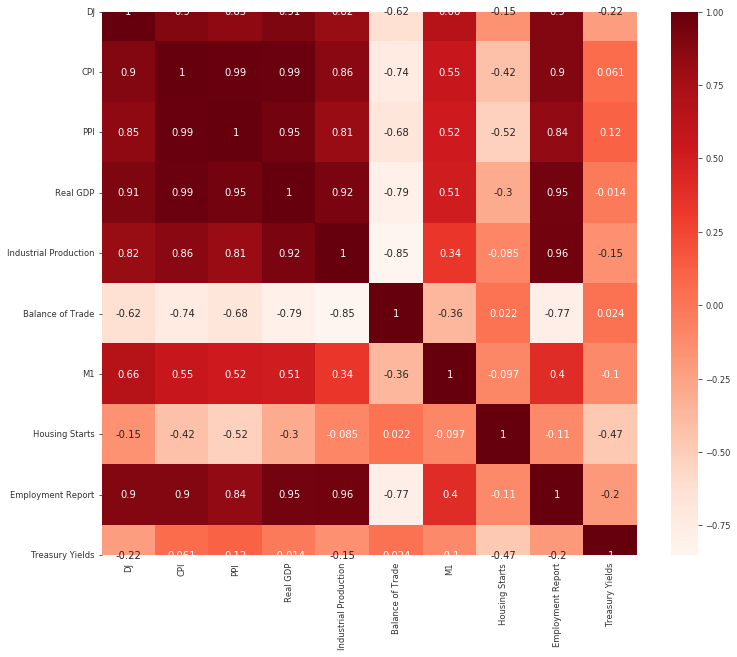

In [79]:
# Dow Jones Features Correlation
plt.figure(figsize=(12,10))
cor = DJ.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [80]:
DJ[['Date', 'DJ']]

,Date,DJ
0,31/12/2020,30606.48
1,30/11/2020,29638.64
2,31/10/2020,26501.60
3,30/9/2020,27781.70
4,31/8/2020,28430.05
...,...,...
343,31/5/1992,3396.88
344,30/4/1992,3359.12
345,31/3/1992,3235.47
346,29/2/1992,3267.67


In [81]:
DJ_ts_uni = TimeSeries.from_dataframe(DJ[['Date', 'DJ']], time_col='Date') 
DJ_ts_feat = TimeSeries.from_dataframe(DJ.drop(['DJ'], axis=1), time_col='Date') 


In [82]:
DJ_ts_feat

<TimeSeries (DataArray) (Date: 348, component: 9, sample: 1)>
array([[[1.383000e+02],
        [1.220000e+02],
        [9.534350e+03],
        ...,
        [1.176000e+03],
        [1.083690e+05],
        [2.170000e+00]],

       [[1.386000e+02],
        [1.223000e+02],
        [9.534350e+03],
        ...,
        [1.250000e+03],
        [1.083110e+05],
        [2.010000e+00]],

       [[1.391000e+02],
        [1.224000e+02],
        [9.534350e+03],
        ...,
...
        ...,
        [1.530000e+03],
        [1.425450e+05],
        [7.200000e-01]],

       [[2.609300e+02],
        [2.045000e+02],
        [1.879443e+04],
        ...,
        [1.553000e+03],
        [1.428090e+05],
        [6.900000e-01]],

       [[2.615600e+02],
        [2.062000e+02],
        [1.879443e+04],
        ...,
        [1.670000e+03],
        [1.425030e+05],
        [7.900000e-01]]])
Coordinates:
  * Date       (Date) datetime64[ns] 1992-01-31 1992-02-29 ... 2020-12-31
  * component  (component) object 'CPI' 'PPI' ... 'Treasury Yields'
Dimensions without coordinates: sample

In [83]:
# Read data
series = DJ_ts_uni 

# we convert monthly number of passengers to average daily number of passengers per month
# series = series / TimeSeries.from_series(series.time_index.days_in_month)
# series = series.astype(np.float32)

# Create training and validation sets:
training_cutoff = pd.Timestamp("20171231")
train, val = series.split_after(training_cutoff)

# Normalize the time series (note: we avoid fitting the transformer on the validation set)
transformer_dj = Scaler()
train_transformed = transformer_dj.fit_transform(train)
val_transformed = transformer_dj.transform(val)
series_transformed = transformer_dj.transform(series)


In [84]:
# create year, month and integer index covariate series
future_covariates = datetime_attribute_timeseries(series, attribute="year", one_hot=False)
future_covariates = future_covariates.stack(
    datetime_attribute_timeseries(series, attribute="month", one_hot=False)
)
future_covariates = future_covariates.stack(
    TimeSeries.from_times_and_values(
        times=series.time_index,
        values=np.arange(len(series)),
        columns=['linear increase']
    )
)
future_covariates = future_covariates.astype(np.float32)

# transform covariates (note: we fit the transformer on train split and can then transform the entire covariates series)
scaler_covs_fut = Scaler()
fut_cov_train, fut_cov_val = future_covariates.split_after(training_cutoff)
scaler_covs_fut.fit(fut_cov_train)
fut_covariates_transformed = scaler_covs_fut.transform(future_covariates)

In [85]:
# future_covariates

In [86]:
# DJ_ts_feat

In [87]:
# create year, month and integer index covariate series

past_covariates = DJ_ts_feat.astype(np.float32)

# transform covariates (note: we fit the transformer on train split and can then transform the entire covariates series)
scaler_covs_past = Scaler()
past_cov_train, past_cov_val = past_covariates.split_after(training_cutoff)
scaler_covs_past.fit(past_covariates)
past_covariates_transformed = scaler_covs_past.transform(past_covariates)

### Univariate Transformer Model

In [35]:
LOAD = False         # True = load previously saved model from disk?  False = (re)train the model
SAVE = "\_TForm_model10e.pth.tar"   # file name to save the model under

EPOCHS = 200
INLEN =  24 # 32 #36          # input size
FEAT = 64           # d_model = number of expected features in the inputs, up to 512    
HEADS = 4           # default 8
ENCODE = 6          # encoder layers
DECODE = 6          # decoder layers
DIM_FF = 256        # dimensions of the feedforward network, default 2048
BATCH = 16           # batch size
ACTF = "relu"       # activation function, relu (default) or gelu
SCHLEARN = None     # a PyTorch learning rate scheduler; None = constant rate
LEARN = 1e-3        # learning rate
VALWAIT = 1         # epochs to wait before evaluating the loss on the test/validation set
DROPOUT = 0.1       # dropout rate
N_FC = 3            # output size

RAND = 23           # random seed
N_SAMPLES = 100     # number of times a prediction is sampled from a probabilistic model
N_JOBS = -1          # parallel processors to use;  -1 = all processors

# default quantiles for QuantileRegression
QUANTILES = [
    0.01,
    0.05,
    0.1,
    0.15,
    0.2,
    0.25,
    0.3,
    0.4,
    0.5,
    0.6,
    0.7,
    0.75,
    0.8,
    0.85,
    0.9,
    0.95,
    0.99,
]

SPLIT = 0.9         # train/test %

FIGSIZE = (9, 6)


qL1, qL2 = 0.01, 0.10        # percentiles of predictions: lower bounds
qU1, qU2 = 1-qL1, 1-qL2,     # upper bounds derived from lower bounds
label_q1 = f'{int(qU1 * 100)} / {int(qL1 * 100)} percentile band'
label_q2 = f'{int(qU2 * 100)} / {int(qL2 * 100)} percentile band'

mpath = os.path.abspath(os.getcwd()) + SAVE     # path and file name to save the model

In [36]:
baseline_transformer_model = TransformerModel(
                    input_chunk_length = INLEN,
                    output_chunk_length = N_FC,
                    batch_size = BATCH,
                    n_epochs = EPOCHS,
                    model_name = "Transformer_Univarite_DowJones",
                    nr_epochs_val_period = VALWAIT,
                    d_model = FEAT,
                    nhead = HEADS,
                    num_encoder_layers = ENCODE,
                    num_decoder_layers = DECODE,
                    dim_feedforward = DIM_FF,
                    dropout = DROPOUT,
                    activation = ACTF,
                    random_state=RAND,
                    likelihood=QuantileRegression(quantiles=QUANTILES), 
                    optimizer_kwargs={'lr': LEARN},
                    # add_encoders={"cyclic": {"future": ["month"]}},
                    save_checkpoints=True,
                    force_reset=True,
                    torch_device_str="cuda"
                    )

In [37]:
# training: load a saved model or (re)train
if LOAD:
    print("have loaded a previously saved model from disk:" + mpath)
    baseline_transformer_model = TransformerModel.load_model(mpath)                            # load previously model from disk 
else:
    baseline_transformer_model.fit(train_transformed, 
                # past_covariates=past_covariates_transformed,
                # future_covariates=fut_covariates_transformed,
                verbose=True)
    print("have saved the model after training:", mpath)
    baseline_transformer_model.save_model(mpath)

Training: 0it [00:00, ?it/s]

have saved the model after training: /content\_TForm_model10e.pth.tar


Predicting: 18it [00:00, ?it/s]

MAPE: 13.35% 
 MSE: 15529060.73 
 MAE: 3573.27 
 Precision Error(PM): 5.05


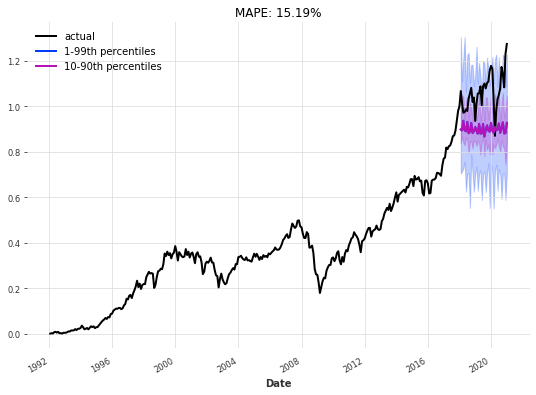

In [38]:
# def eval_model(model, n, actual_series, val_series):
#     pred_series = model.predict(n=n, num_samples=num_samples, )

#     # plot actual series
#     plt.figure(figsize=figsize)
#     actual_series[: pred_series.end_time()].plot(label="actual")

#     # plot prediction with quantile ranges
#     pred_series.plot(
#         low_quantile=lowest_q, high_quantile=highest_q, label=label_q_outer
#     )
#     pred_series.plot(low_quantile=low_q, high_quantile=high_q, label=label_q_inner)

#     plt.title("MAPE: {:.2f}%".format(mape(val_series, pred_series)))
#     plt.legend()


eval_model(baseline_transformer_model, 36, series_transformed, val_transformed, transformer_dj)

In [39]:
input_chunk_length = 24
forecast_horizon = 3

backtest_series = baseline_transformer_model.historical_forecasts(
    series_transformed,
    # past_covariates=past_covariates_transformed,
    start=train.end_time() + train.freq,
    num_samples=num_samples,
    forecast_horizon=forecast_horizon,
    stride=forecast_horizon,
    last_points_only=False,
    retrain=False,
    verbose=True,
    overlap_end=True
)

  0%|          | 0/12 [00:00<?, ?it/s]

Predicting: 18it [00:00, ?it/s]

  8%|▊         | 1/12 [00:00<00:02,  4.79it/s]

Predicting: 18it [00:00, ?it/s]

 17%|█▋        | 2/12 [00:00<00:02,  4.69it/s]

Predicting: 18it [00:00, ?it/s]

 25%|██▌       | 3/12 [00:00<00:01,  4.70it/s]

Predicting: 18it [00:00, ?it/s]

 33%|███▎      | 4/12 [00:00<00:01,  4.65it/s]

Predicting: 18it [00:00, ?it/s]

 42%|████▏     | 5/12 [00:01<00:01,  4.80it/s]

Predicting: 18it [00:00, ?it/s]

 50%|█████     | 6/12 [00:01<00:01,  4.77it/s]

Predicting: 18it [00:00, ?it/s]

 58%|█████▊    | 7/12 [00:01<00:01,  4.75it/s]

Predicting: 18it [00:00, ?it/s]

 67%|██████▋   | 8/12 [00:01<00:00,  4.75it/s]

Predicting: 18it [00:00, ?it/s]

 75%|███████▌  | 9/12 [00:01<00:00,  4.73it/s]

Predicting: 18it [00:00, ?it/s]

 83%|████████▎ | 10/12 [00:02<00:00,  4.61it/s]

Predicting: 18it [00:00, ?it/s]

 92%|█████████▏| 11/12 [00:02<00:00,  4.58it/s]

Predicting: 18it [00:00, ?it/s]

100%|██████████| 12/12 [00:02<00:00,  4.65it/s]


MAPE: 12.7144% 
 MSE: 14342809.3185 
 MAE: 3404.8372 
 Precision Error(PM): 4.6606
Pre-covid MAPE: 11.4940% 
 Pre-covid MSE: 10960774.9978 
 Pre-covid MAE: 3019.0584 
 Pre-covid Precision Error(PM): 6.7143
Post-covid MAPE: 15.1552% 
 Post-covid MSE: 21106877.9597 
 Post-covid MAE: 4176.3949 
 Post-covid Precision Error(PM): 3.6738


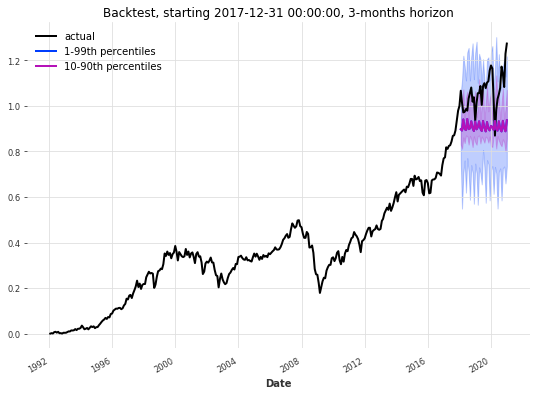

In [40]:
eval_backtest(
    backtest_series=concatenate(backtest_series),
    actual_series=series_transformed,
    horizon=forecast_horizon,
    start=training_cutoff,
    transformer=transformer_dj,
)

### Mulitvariate Transformer Model

In [100]:
LOAD = False         # True = load previously saved model from disk?  False = (re)train the model
SAVE = "\_TForm_model10e.pth.tar"   # file name to save the model under

EPOCHS = 200
INLEN =  24 #32 #36          # input size
FEAT = 64           # d_model = number of expected features in the inputs, up to 512    
HEADS = 16           # default 8
ENCODE = 6          # encoder layers
DECODE = 6          # decoder layers
DIM_FF = 256 #128        # dimensions of the feedforward network, default 2048
BATCH = 16          # batch size
ACTF = "relu"       # activation function, relu (default) or gelu
SCHLEARN = None     # a PyTorch learning rate scheduler; None = constant rate
LEARN = 1e-3        # learning rate
VALWAIT = 1         # epochs to wait before evaluating the loss on the test/validation set
DROPOUT = 0.1       # dropout rate
N_FC = 3            # output size

RAND = 23           # random seed
N_SAMPLES = 100     # number of times a prediction is sampled from a probabilistic model
N_JOBS = -1          # parallel processors to use;  -1 = all processors

# default quantiles for QuantileRegression
QUANTILES = [
    0.01,
    0.05,
    0.1,
    0.15,
    0.2,
    0.25,
    0.3,
    0.4,
    0.5,
    0.6,
    0.7,
    0.75,
    0.8,
    0.85,
    0.9,
    0.95,
    0.99,
]

SPLIT = 0.9         # train/test %

FIGSIZE = (9, 6)


qL1, qL2 = 0.01, 0.10        # percentiles of predictions: lower bounds
qU1, qU2 = 1-qL1, 1-qL2,     # upper bounds derived from lower bounds
label_q1 = f'{int(qU1 * 100)} / {int(qL1 * 100)} percentile band'
label_q2 = f'{int(qU2 * 100)} / {int(qL2 * 100)} percentile band'

mpath = os.path.abspath(os.getcwd()) + SAVE     # path and file name to save the model

In [101]:
baseline_transformer_model = TransformerModel(
                    input_chunk_length = INLEN,
                    output_chunk_length = N_FC,
                    batch_size = BATCH,
                    n_epochs = EPOCHS,
                    model_name = "Transformer_Multivariate_DowJones",
                    nr_epochs_val_period = VALWAIT,
                    d_model = FEAT,
                    nhead = HEADS,
                    num_encoder_layers = ENCODE,
                    num_decoder_layers = DECODE,
                    dim_feedforward = DIM_FF,
                    dropout = DROPOUT,
                    activation = ACTF,
                    random_state=RAND,
                    likelihood=QuantileRegression(quantiles=QUANTILES), 
                    optimizer_kwargs={'lr': LEARN},
                    # add_encoders={"cyclic": {"future": ["month"]}},
                    save_checkpoints=True,
                    force_reset=True,
                    torch_device_str="cuda"
                    )

In [102]:
# training: load a saved model or (re)train
if LOAD:
    print("have loaded a previously saved model from disk:" + mpath)
    baseline_transformer_model = TransformerModel.load_model(mpath)                            # load previously model from disk 
else:
    baseline_transformer_model.fit(  train_transformed, 
                past_covariates=past_covariates_transformed,
                val_past_covariates=past_covariates_transformed,
                # future_covariates=fut_covariates_transformed,
                verbose=True)
    print("have saved the model after training:", mpath)
    baseline_transformer_model.save_model(mpath)

Training: 0it [00:00, ?it/s]

have saved the model after training: /content\_TForm_model10e.pth.tar


Predicting: 18it [00:00, ?it/s]

MAPE: 11.77% 
 MSE: 12631765.22 
 MAE: 3157.09 
 Precision Error(PM): 4.10


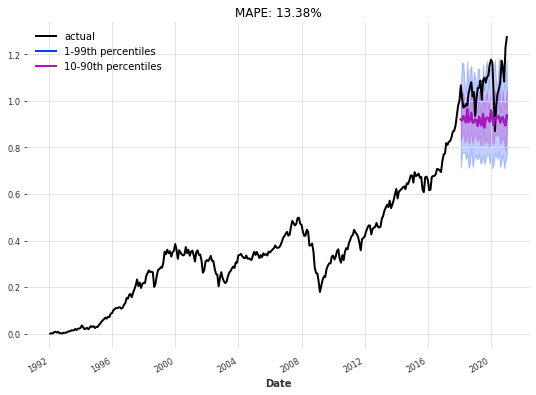

In [103]:

eval_model(baseline_transformer_model, 36, series_transformed, val_transformed, transformer_dj)

In [104]:
input_chunk_length = 24
forecast_horizon = 3

backtest_series = baseline_transformer_model.historical_forecasts(
    series_transformed,
    past_covariates=past_covariates_transformed,
    # val_past_covariates=past_covariates_transformed,
    start=train.end_time() + train.freq,
    num_samples=num_samples,
    forecast_horizon=forecast_horizon,
    stride=forecast_horizon,
    last_points_only=False,
    retrain=False,
    verbose=True,
    overlap_end=True
)

# def eval_backtest(backtest_series, actual_series, horizon, start, transformer):
#     plt.figure(figsize=figsize)
#     actual_series.plot(label="actual")
#     backtest_series.plot(
#         low_quantile=lowest_q, high_quantile=highest_q, label=label_q_outer
#     )
#     backtest_series.plot(low_quantile=low_q, high_quantile=high_q, label=label_q_inner)
#     plt.legend()
#     plt.title(f"Backtest, starting {start}, {horizon}-months horizon")
#     print(
#         "MAPE: {:.2f}%".format(
#             mape(
#                 transformer.inverse_transform(actual_series),
#                 transformer.inverse_transform(backtest_series),
#             )
#         )
#     )



  0%|          | 0/12 [00:00<?, ?it/s]

Predicting: 18it [00:00, ?it/s]

  8%|▊         | 1/12 [00:00<00:02,  4.55it/s]

Predicting: 18it [00:00, ?it/s]

 17%|█▋        | 2/12 [00:00<00:02,  4.77it/s]

Predicting: 18it [00:00, ?it/s]

 25%|██▌       | 3/12 [00:00<00:01,  4.76it/s]

Predicting: 18it [00:00, ?it/s]

 33%|███▎      | 4/12 [00:00<00:01,  4.85it/s]

Predicting: 18it [00:00, ?it/s]

 42%|████▏     | 5/12 [00:01<00:01,  4.89it/s]

Predicting: 18it [00:00, ?it/s]

 50%|█████     | 6/12 [00:01<00:01,  4.85it/s]

Predicting: 18it [00:00, ?it/s]

 58%|█████▊    | 7/12 [00:01<00:01,  4.73it/s]

Predicting: 18it [00:00, ?it/s]

 67%|██████▋   | 8/12 [00:01<00:00,  4.67it/s]

Predicting: 18it [00:00, ?it/s]

 75%|███████▌  | 9/12 [00:01<00:00,  4.66it/s]

Predicting: 18it [00:00, ?it/s]

 83%|████████▎ | 10/12 [00:02<00:00,  4.69it/s]

Predicting: 18it [00:00, ?it/s]

 92%|█████████▏| 11/12 [00:02<00:00,  4.66it/s]

Predicting: 18it [00:00, ?it/s]

100%|██████████| 12/12 [00:02<00:00,  4.71it/s]


MAPE: 11.3093% 
 MSE: 12062349.4544 
 MAE: 3039.4227 
 Precision Error(PM): 3.9196
Pre-covid MAPE: 9.9939% 
 Pre-covid MSE: 8676462.4008 
 Pre-covid MAE: 2631.0065 
 Pre-covid Precision Error(PM): 5.3150
Post-covid MAPE: 13.9400% 
 Post-covid MSE: 18834123.5617 
 Post-covid MAE: 3856.2551 
 Post-covid Precision Error(PM): 3.2782


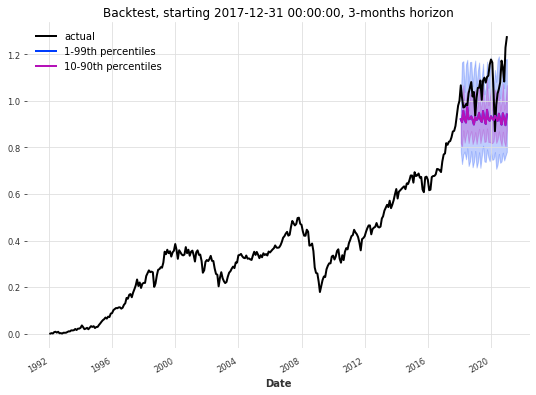

In [105]:
eval_backtest(
    backtest_series=concatenate(backtest_series),
    actual_series=series_transformed,
    horizon=forecast_horizon,
    start=training_cutoff,
    transformer=transformer_dj,
)

### Univariate TFT Model

In [47]:
LOAD = False         # True = load previously saved model from disk?  False = (re)train the model
SAVE = "\_TFTForm_model10e.pth.tar"   # file name to save the model under
mpath = os.path.abspath(os.getcwd()) + SAVE     # path and file name to save the model

In [48]:
# default quantiles for QuantileRegression
quantiles = [
    0.01,
    0.05,
    0.1,
    0.15,
    0.2,
    0.25,
    0.3,
    0.4,
    0.5,
    0.6,
    0.7,
    0.75,
    0.8,
    0.85,
    0.9,
    0.95,
    0.99,
]
input_chunk_length = 24
forecast_horizon = 3
tst_model = TFTModel(
    input_chunk_length=input_chunk_length,
    output_chunk_length=forecast_horizon,
    model_name = "TST_Model_Univariate_DowJones",
    hidden_size=64,
    lstm_layers=1,
    num_attention_heads=4,
    dropout=0.1,
    batch_size=16,
    n_epochs=200,
    add_relative_index=False,
    add_encoders={"cyclic": {"future": ["month"]}},
    likelihood=QuantileRegression(
        quantiles=quantiles
    ),  # QuantileRegression is set per default
    # loss_fn=MSELoss(),
    random_state=23,
    save_checkpoints=True,
    force_reset=True,
    torch_device_str="cuda"
)

In [49]:
# training: load a saved model or (re)train
if LOAD:
    print("have loaded a previously saved model from disk:" + mpath)
    tst_model = TransformerModel.load_model(mpath)                            # load previously model from disk 
else:
    tst_model.fit(  train_transformed, 
                #  past_covariates=past_covariates_transformed,
                future_covariates=fut_covariates_transformed,
                verbose=True)
    print("have saved the model after training:", mpath)
    tst_model.save_model(mpath)

Training: 0it [00:00, ?it/s]

have saved the model after training: /content\_TFTForm_model10e.pth.tar


Predicting: 18it [00:00, ?it/s]

MAPE: 11.35% 
 MSE: 10982055.11 
 MAE: 3029.77 
 Precision Error(PM): 3.57


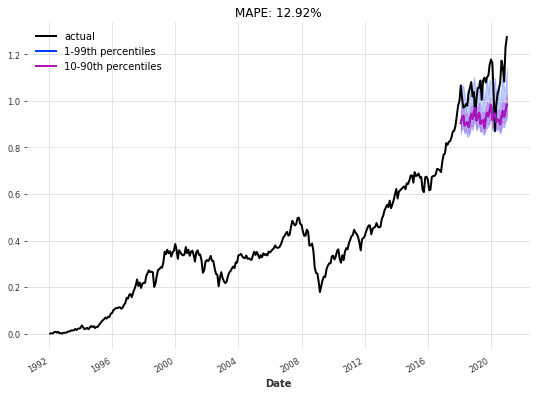

In [50]:
eval_model(tst_model, 36, series_transformed, val_transformed, transformer_dj)


In [51]:

forecast_horizon= 3
last_points_only = False
backtest_series_ice = tst_model.historical_forecasts(
    series_transformed,
    # past_covariates=past_covariates_transformed,
    future_covariates=fut_covariates_transformed,
    num_samples=num_samples,
    start=train.end_time() + train.freq,
    forecast_horizon=forecast_horizon,
    stride=1 if last_points_only else forecast_horizon,
    retrain=False,
    last_points_only=last_points_only,
    overlap_end=True,
    verbose=True,
)

# def eval_backtest(backtest_series, actual_series, horizon, start, transformer):
#     plt.figure(figsize=figsize)
#     actual_series.plot(label="actual")
#     backtest_series.plot(
#         low_quantile=lowest_q, high_quantile=highest_q, label=label_q_outer
#     )
#     backtest_series.plot(low_quantile=low_q, high_quantile=high_q, label=label_q_inner)
#     plt.legend()
#     plt.title(f"Backtest, starting {start}, {horizon}-months horizon")
#     print(
#         "MAPE: {:.2f}%".format(
#             mape(
#                 transformer.inverse_transform(actual_series),
#                 transformer.inverse_transform(backtest_series),
#             )
#         )
#     )



  0%|          | 0/12 [00:00<?, ?it/s]

Predicting: 18it [00:00, ?it/s]

  8%|▊         | 1/12 [00:00<00:02,  4.08it/s]

Predicting: 18it [00:00, ?it/s]

 17%|█▋        | 2/12 [00:00<00:02,  4.02it/s]

Predicting: 18it [00:00, ?it/s]

 25%|██▌       | 3/12 [00:00<00:02,  4.04it/s]

Predicting: 18it [00:00, ?it/s]

 33%|███▎      | 4/12 [00:00<00:01,  4.01it/s]

Predicting: 18it [00:00, ?it/s]

 42%|████▏     | 5/12 [00:01<00:01,  4.02it/s]

Predicting: 18it [00:00, ?it/s]

 50%|█████     | 6/12 [00:01<00:01,  3.93it/s]

Predicting: 18it [00:00, ?it/s]

 58%|█████▊    | 7/12 [00:01<00:01,  3.87it/s]

Predicting: 18it [00:00, ?it/s]

 67%|██████▋   | 8/12 [00:02<00:01,  3.83it/s]

Predicting: 18it [00:00, ?it/s]

 75%|███████▌  | 9/12 [00:02<00:00,  3.86it/s]

Predicting: 18it [00:00, ?it/s]

 83%|████████▎ | 10/12 [00:02<00:00,  3.80it/s]

Predicting: 18it [00:00, ?it/s]

 92%|█████████▏| 11/12 [00:02<00:00,  3.81it/s]

Predicting: 18it [00:00, ?it/s]

100%|██████████| 12/12 [00:03<00:00,  3.88it/s]


MAPE: 11.3093% 
 MSE: 12062349.4544 
 MAE: 3039.4227 
 Precision Error(PM): 3.9196
Pre-covid MAPE: 9.9939% 
 Pre-covid MSE: 8676462.4008 
 Pre-covid MAE: 2631.0065 
 Pre-covid Precision Error(PM): 5.3150
Post-covid MAPE: 13.9400% 
 Post-covid MSE: 18834123.5617 
 Post-covid MAE: 3856.2551 
 Post-covid Precision Error(PM): 3.2782


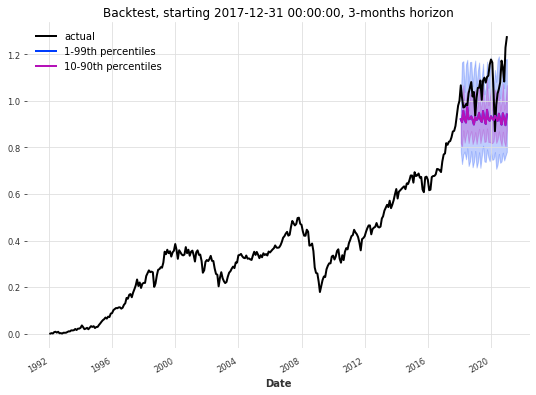

In [52]:
eval_backtest(
    backtest_series=concatenate(backtest_series),
    actual_series=series_transformed,
    horizon=forecast_horizon,
    start=training_cutoff,
    transformer=transformer_dj,
)

### Multivariate TFT Model (3-month ahead)


In [94]:
LOAD = False         # True = load previously saved model from disk?  False = (re)train the model
SAVE = "\_TFTForm_model10e.pth.tar"   # file name to save the model under
mpath = os.path.abspath(os.getcwd()) + SAVE     # path and file name to save the model

In [95]:
# default quantiles for QuantileRegression
quantiles = [
    0.01,
    0.05,
    0.1,
    0.15,
    0.2,
    0.25,
    0.3,
    0.4,
    0.5,
    0.6,
    0.7,
    0.75,
    0.8,
    0.85,
    0.9,
    0.95,
    0.99,
]
input_chunk_length = 24
forecast_horizon = 3
tst_model = TFTModel(
    input_chunk_length=input_chunk_length,
    output_chunk_length=forecast_horizon,
    model_name = "TST_Model_Multivariate_DowJones_3m",
    hidden_size=64,
    lstm_layers=1,
    num_attention_heads=16,
    dropout=0.1,
    batch_size=16,
    n_epochs=200,
    add_relative_index=False,
    add_encoders={"cyclic": {"future": ["month"]}},
    likelihood=QuantileRegression(
        quantiles=quantiles
    ),  # QuantileRegression is set per default
    # loss_fn=MSELoss(),
    random_state=23,
    save_checkpoints=True,
    force_reset=True,
    torch_device_str="cuda"
)

In [96]:
# training: load a saved model or (re)train
if LOAD:
    print("have loaded a previously saved model from disk:" + mpath)
    tst_model = TransformerModel.load_model(mpath)                            # load previously model from disk 
else:
    tst_model.fit(train_transformed, 
                 past_covariates=past_covariates_transformed,
                 future_covariates=fut_covariates_transformed,
                 verbose=True)
    print("have saved the model after training:", mpath)
    tst_model.save_model(mpath)

Training: 0it [00:00, ?it/s]

have saved the model after training: /content\_TFTForm_model10e.pth.tar


Predicting: 18it [00:00, ?it/s]

MAPE: 13.89% 
 MSE: 19162293.34 
 MAE: 3731.95 
 Precision Error(PM): 6.23


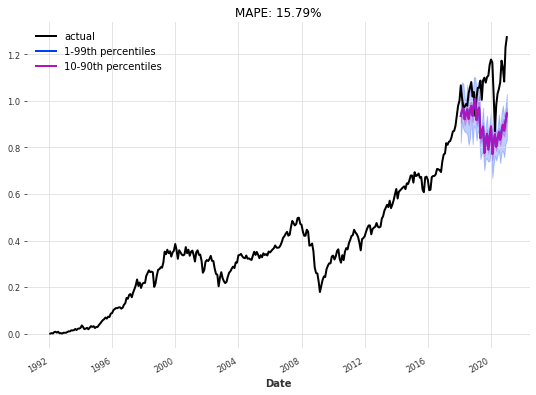

In [97]:
eval_model(tst_model, 36, series_transformed, val_transformed,  transformer_dj)



  0%|          | 0/12 [00:00<?, ?it/s]

Predicting: 18it [00:00, ?it/s]


  8%|▊         | 1/12 [00:00<00:03,  2.80it/s]

Predicting: 18it [00:00, ?it/s]


 17%|█▋        | 2/12 [00:00<00:03,  2.90it/s]

Predicting: 18it [00:00, ?it/s]


 25%|██▌       | 3/12 [00:01<00:03,  2.92it/s]

Predicting: 18it [00:00, ?it/s]


 33%|███▎      | 4/12 [00:01<00:02,  2.88it/s]

Predicting: 18it [00:00, ?it/s]


 42%|████▏     | 5/12 [00:01<00:02,  2.92it/s]

Predicting: 18it [00:00, ?it/s]


 50%|█████     | 6/12 [00:02<00:02,  2.92it/s]

Predicting: 18it [00:00, ?it/s]


 58%|█████▊    | 7/12 [00:02<00:01,  2.90it/s]

Predicting: 18it [00:00, ?it/s]


 67%|██████▋   | 8/12 [00:02<00:01,  2.92it/s]

Predicting: 18it [00:00, ?it/s]


 75%|███████▌  | 9/12 [00:03<00:01,  2.93it/s]

Predicting: 18it [00:00, ?it/s]


 83%|████████▎ | 10/12 [00:03<00:00,  2.91it/s]

Predicting: 18it [00:00, ?it/s]


 92%|█████████▏| 11/12 [00:03<00:00,  2.91it/s]

Predicting: 18it [00:00, ?it/s]


100%|██████████| 12/12 [00:04<00:00,  2.91it/s]


MAPE: 13.8854% 
 MSE: 19190335.1423 
 MAE: 3731.6279 
 Precision Error(PM): 6.2357
Pre-covid MAPE: 11.5489% 
 Pre-covid MSE: 13854644.3388 
 Pre-covid MAE: 3055.5083 
 Pre-covid Precision Error(PM): 8.4870
Post-covid MAPE: 18.5585% 
 Post-covid MSE: 29861716.7494 
 Post-covid MAE: 5083.8672 
 Post-covid Precision Error(PM): 5.1976


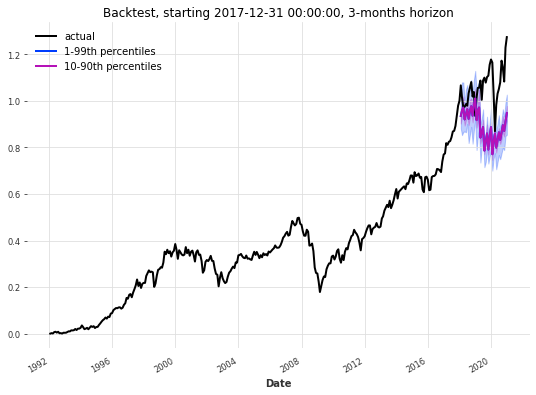

In [98]:

forecast_horizon= 3
last_points_only = False
backtest_series = tst_model.historical_forecasts(
    series_transformed,
    past_covariates=past_covariates_transformed,
    future_covariates=fut_covariates_transformed,
    num_samples=num_samples,
    start=train.end_time() + train.freq,
    forecast_horizon=forecast_horizon,
    stride=1 if last_points_only else forecast_horizon,
    retrain=False,
    last_points_only=last_points_only,
    overlap_end=True,
    verbose=True,
)


eval_backtest(
    backtest_series=concatenate(backtest_series),
    actual_series=series_transformed,
    horizon=forecast_horizon,
    start=training_cutoff,
    transformer=transformer_dj,
)

In [99]:
# from torch.nn import MSELoss
# parameters = {
#     "input_chunk_length": [36],
#     "output_chunk_length": [12],
#     "model_name": ["TST_Model_Multivariate_DowJones"],
#     "hidden_size": [32, 64],
#     "num_attention_heads": [4, 8],
#     "batch_size":[16],
#     "n_epochs": [200],
#     "full_attention": [True, False],
#     "add_encoders": [{"cyclic": {"future": ["month"]}}],
#     "likelihood": [QuantileRegression(
#         quantiles=quantiles
#     )],
#     "random_state":[23],
#     "torch_device_str": ["cuda"]
# }

# tst_model.gridsearch(parameters=parameters,
#                      series=series_transformed,
#                      past_covariates=past_covariates_transformed,
#                      future_covariates=fut_covariates_transformed,
#                      forecast_horizon=12,
#                      start=training_cutoff,
#                      n_jobs=-1,
#                      metric=MSELoss(),
#                      verbose=True)


### Multivariate TFT Model (1-month ahead)


In [59]:
# LOAD = False         # True = load previously saved model from disk?  False = (re)train the model
# SAVE = "\_TFTForm_model10e.pth.tar"   # file name to save the model under
# mpath = os.path.abspath(os.getcwd()) + SAVE     # path and file name to save the model

In [60]:
# # default quantiles for QuantileRegression
# quantiles = [
#     0.01,
#     0.05,
#     0.1,
#     0.15,
#     0.2,
#     0.25,
#     0.3,
#     0.4,
#     0.5,
#     0.6,
#     0.7,
#     0.75,
#     0.8,
#     0.85,
#     0.9,
#     0.95,
#     0.99,
# ]
# input_chunk_length = 36
# forecast_horizon = 1
# tst_model = TFTModel(
#     input_chunk_length=input_chunk_length,
#     output_chunk_length=forecast_horizon,
#     model_name = "TST_Model_Multivariate_DowJones_1m",
#     hidden_size=64, #64,
#     lstm_layers=1,
#     num_attention_heads=16, #12,
#     dropout=0.1,
#     batch_size=16,
#     n_epochs=300,
#     add_relative_index=False,
#     add_encoders={"cyclic": {"future": ["month"]}},
#     likelihood=QuantileRegression(
#         quantiles=quantiles
#     ),  # QuantileRegression is set per default
#     # loss_fn=MSELoss(),
#     random_state=23,
#     save_checkpoints=True,
#     force_reset=True,
#     torch_device_str="cuda"
# )

In [61]:
# # training: load a saved model or (re)train
# if LOAD:
#     print("have loaded a previously saved model from disk:" + mpath)
#     tst_model = TransformerModel.load_model(mpath)                            # load previously model from disk 
# else:
#     tst_model.fit(train_transformed, 
#                  past_covariates=past_covariates_transformed,
#                  future_covariates=fut_covariates_transformed,
#                  verbose=True)
#     print("have saved the model after training:", mpath)
#     tst_model.save_model(mpath)

In [62]:
# eval_model(tst_model, 36, series_transformed, val_transformed, transformer_dj)


In [63]:

# forecast_horizon= 1
# last_points_only = False
# backtest_series = tst_model.historical_forecasts(
#     series_transformed,
#     past_covariates=past_covariates_transformed,
#     future_covariates=fut_covariates_transformed,
#     num_samples=num_samples,
#     start=train.end_time() + train.freq,
#     forecast_horizon=forecast_horizon,
#     stride=1 if last_points_only else forecast_horizon,
#     retrain=False,
#     last_points_only=last_points_only,
#     overlap_end=True,
#     verbose=True,
# )


# eval_backtest(
#     backtest_series=concatenate(backtest_series),
#     actual_series=series_transformed,
#     horizon=forecast_horizon,
#     start=training_cutoff,
#     transformer=transformer,
# )

## LSTM (DowJones)

In [64]:
quantiles = [
    0.01,
    0.05,
    0.1,
    0.15,
    0.2,
    0.25,
    0.3,
    0.4,
    0.5,
    0.6,
    0.7,
    0.75,
    0.8,
    0.85,
    0.9,
    0.95,
    0.99,
]

lstm_model_dj = RNNModel(
    model="LSTM",
    hidden_dim=64,
    dropout=0.1,
    batch_size=16,
    n_epochs=200,
    optimizer_kwargs={"lr": 1e-3},
    model_name="LSTM_Univariate",
    log_tensorboard=True,
    random_state=23,
    training_length=27,
    input_chunk_length=24,
    force_reset=True,
    save_checkpoints=True,
    likelihood=QuantileRegression(
        quantiles=quantiles
    )
)

In [65]:
lstm_model_dj.fit(
    train_transformed,
    future_covariates=fut_covariates_transformed,
    val_series=val_transformed,
    val_future_covariates=fut_covariates_transformed,
    verbose=True,
)

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Predicting: 18it [00:00, ?it/s]

MAPE: 7.07% 
 MSE: 5327665.54 
 MAE: 1772.81 
 Precision Error(PM): 1.73


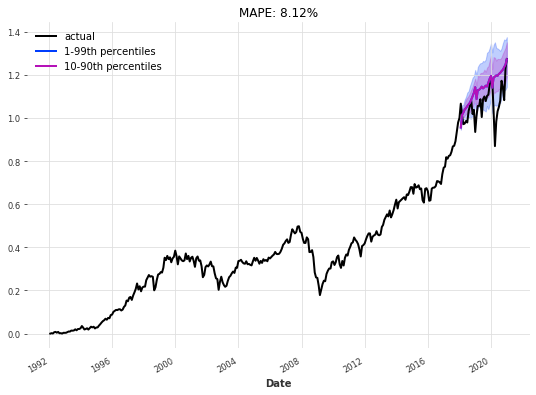

In [66]:

eval_model(lstm_model_dj, 36, series_transformed, val_transformed, transformer_dj)


  0%|          | 0/12 [00:00<?, ?it/s]

Predicting: 18it [00:00, ?it/s]

  8%|▊         | 1/12 [00:00<00:01,  8.89it/s]

Predicting: 18it [00:00, ?it/s]

 17%|█▋        | 2/12 [00:00<00:01,  9.20it/s]

Predicting: 18it [00:00, ?it/s]

 25%|██▌       | 3/12 [00:00<00:00,  9.20it/s]

Predicting: 18it [00:00, ?it/s]

 33%|███▎      | 4/12 [00:00<00:00,  9.41it/s]

Predicting: 18it [00:00, ?it/s]

 42%|████▏     | 5/12 [00:00<00:00,  9.34it/s]

Predicting: 18it [00:00, ?it/s]

 50%|█████     | 6/12 [00:00<00:00,  9.46it/s]

Predicting: 18it [00:00, ?it/s]

 58%|█████▊    | 7/12 [00:00<00:00,  9.51it/s]

Predicting: 18it [00:00, ?it/s]

 67%|██████▋   | 8/12 [00:00<00:00,  9.45it/s]

Predicting: 18it [00:00, ?it/s]

Predicting: 18it [00:00, ?it/s]

 83%|████████▎ | 10/12 [00:01<00:00,  9.47it/s]

Predicting: 18it [00:00, ?it/s]

 92%|█████████▏| 11/12 [00:01<00:00,  9.49it/s]

Predicting: 18it [00:00, ?it/s]

100%|██████████| 12/12 [00:01<00:00,  9.23it/s]


MAPE: 5.7496% 
 MSE: 3765715.8854 
 MAE: 1449.8626 
 Precision Error(PM): 1.2236
Pre-covid MAPE: 4.6563% 
 Pre-covid MSE: 2355331.1441 
 Pre-covid MAE: 1172.0894 
 Pre-covid Precision Error(PM): 1.4428
Post-covid MAPE: 7.9363% 
 Post-covid MSE: 6586485.3678 
 Post-covid MAE: 2005.4088 
 Post-covid Precision Error(PM): 1.1464


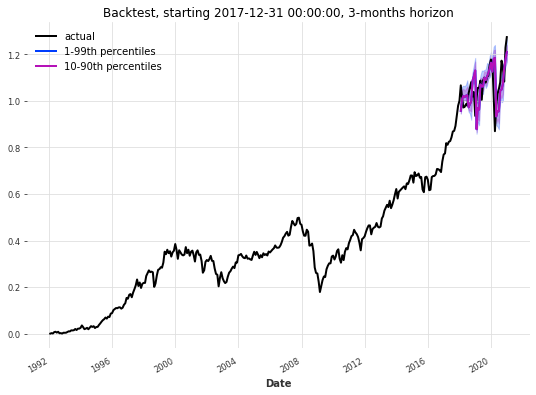

In [67]:

forecast_horizon= 3
last_points_only = False
backtest_series = lstm_model_dj.historical_forecasts(
    series_transformed,
    # past_covariates=past_covariates_transformed,
    future_covariates=fut_covariates_transformed,
    num_samples=num_samples,
    start=train.end_time() + train.freq,
    forecast_horizon=forecast_horizon,
    stride=1 if last_points_only else forecast_horizon,
    retrain=False,
    last_points_only=last_points_only,
    overlap_end=True,
    verbose=True,
)

eval_backtest(
    backtest_series=concatenate(backtest_series),
    actual_series=series_transformed,
    horizon=forecast_horizon,
    start=training_cutoff,
    transformer=transformer_dj,
)

# backtest_series = lstm_model.historical_forecasts(
#     series_transformed,
#     future_covariates=future_covariates,
#     start=pd.Timestamp("20171231"),
#     forecast_horizon=6,
#     retrain=False,
#     verbose=True,
# )

### Block LSTM

In [68]:
quantiles = [
    0.01,
    0.05,
    0.1,
    0.15,
    0.2,
    0.25,
    0.3,
    0.4,
    0.5,
    0.6,
    0.7,
    0.75,
    0.8,
    0.85,
    0.9,
    0.95,
    0.99,
]

# lstm_model = RNNModel(
#     model="LSTM",
#     hidden_dim=64,
#     dropout=0.1,
#     batch_size=16,
#     n_epochs=200,
#     optimizer_kwargs={"lr": 1e-3},
#     model_name="LSTM_Univariate",
#     log_tensorboard=True,
#     random_state=23,
#     training_length=32,
#     input_chunk_length=24,
#     force_reset=True,
#     save_checkpoints=True,
#     likelihood=QuantileRegression(
#         quantiles=quantiles
#     )
# )
BlockLstm_model=BlockRNNModel(
    model="GRU",
    input_chunk_length=24,
    output_chunk_length=3,
    hidden_size=64,
    n_rnn_layers=1,
    batch_size=16,
    n_epochs=200,
    dropout=0.1,
    model_name="sun_GRU",
    nr_epochs_val_period=1,
    optimizer_kwargs={"lr": 1e-3},
    log_tensorboard=True,
    random_state=23,
    force_reset=True,
    likelihood=QuantileRegression(
        quantiles=quantiles
    )
)


In [69]:
BlockLstm_model.fit(
    train_transformed,
    past_covariates=past_covariates_transformed,
    val_series=val_transformed,
    val_past_covariates=past_covariates_transformed,
    verbose=True,
)

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Predicting: 18it [00:00, ?it/s]

MAPE: 18.06% 
 MSE: 27062440.56 
 MAE: 4677.55 
 Precision Error(PM): 8.79


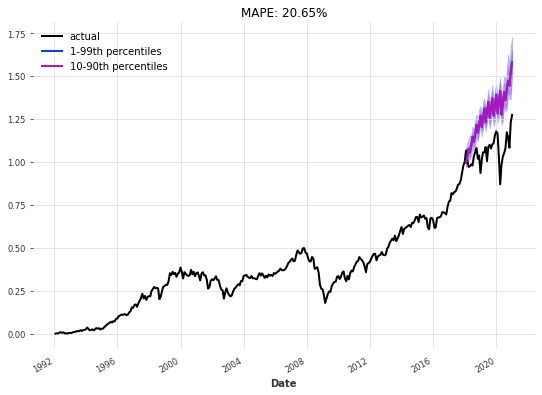

In [70]:
# def eval_model(model):
#     pred_series = model.predict(n=36, future_covariates=future_covariates)
#     plt.figure(figsize=(8, 5))
#     series_transformed.plot(label="actual")
#     pred_series.plot(label="forecast")
#     plt.title("MAPE: {:.2f}%".format(mape(pred_series, val_transformed)))
#     plt.legend()


# eval_model(lstm_model)

# def eval_model(model, n, actual_series, val_series):
#     pred_series = model.predict(n=n, num_samples=num_samples, roll_size=1, )

#     # plot actual series
#     plt.figure(figsize=figsize)
#     actual_series[: pred_series.end_time()].plot(label="actual")

#     # plot prediction with quantile ranges
#     pred_series.plot(
#         low_quantile=lowest_q, high_quantile=highest_q, label=label_q_outer
#     )
#     pred_series.plot(low_quantile=low_q, high_quantile=high_q, label=label_q_inner)

#     plt.title("MAPE: {:.2f}%".format(mape(val_series, pred_series)))
#     plt.legend()

eval_model(BlockLstm_model, 36, series_transformed, val_transformed, transformer_dj)


  0%|          | 0/12 [00:00<?, ?it/s]

Predicting: 18it [00:00, ?it/s]

Predicting: 18it [00:00, ?it/s]

 17%|█▋        | 2/12 [00:00<00:01,  9.30it/s]

Predicting: 18it [00:00, ?it/s]

 25%|██▌       | 3/12 [00:00<00:00,  9.31it/s]

Predicting: 18it [00:00, ?it/s]

 33%|███▎      | 4/12 [00:00<00:00,  9.13it/s]

Predicting: 18it [00:00, ?it/s]

Predicting: 18it [00:00, ?it/s]

 50%|█████     | 6/12 [00:00<00:00,  9.91it/s]

Predicting: 18it [00:00, ?it/s]

Predicting: 18it [00:00, ?it/s]

 67%|██████▋   | 8/12 [00:00<00:00, 10.42it/s]

Predicting: 18it [00:00, ?it/s]

Predicting: 18it [00:00, ?it/s]

 83%|████████▎ | 10/12 [00:01<00:00,  9.88it/s]

Predicting: 18it [00:00, ?it/s]

Predicting: 18it [00:00, ?it/s]

100%|██████████| 12/12 [00:01<00:00,  9.87it/s]


MAPE: 8.3553% 
 MSE: 7891925.5253 
 MAE: 2127.8085 
 Precision Error(PM): 2.5644
Pre-covid MAPE: 6.3272% 
 Pre-covid MSE: 4239540.9453 
 Pre-covid MAE: 1601.6533 
 Pre-covid Precision Error(PM): 2.5970
Post-covid MAPE: 12.4115% 
 Post-covid MSE: 15196694.6853 
 Post-covid MAE: 3180.1189 
 Post-covid Precision Error(PM): 2.6451


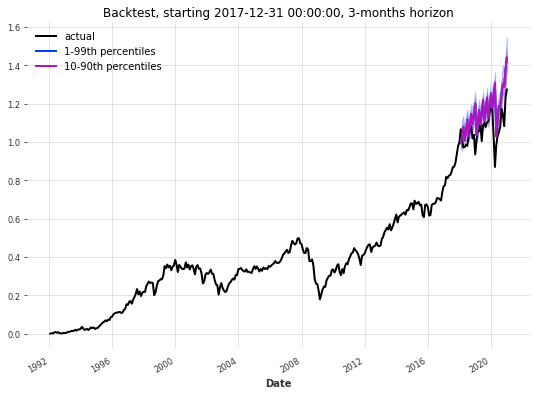

In [71]:

forecast_horizon= 3
last_points_only = False
backtest_series = BlockLstm_model.historical_forecasts(
    series_transformed,
    past_covariates=past_covariates_transformed,
    # future_covariates=fut_covariates_transformed,
    num_samples=num_samples,
    start=train.end_time() + train.freq,
    forecast_horizon=forecast_horizon,
    stride=1 if last_points_only else forecast_horizon,
    retrain=False,
    last_points_only=last_points_only,
    overlap_end=True,
    verbose=True,
)

# def eval_backtest(backtest_series, actual_series, horizon, start, transformer):
#     plt.figure(figsize=figsize)
#     actual_series.plot(label="actual")
#     backtest_series.plot(
#         low_quantile=lowest_q, high_quantile=highest_q, label=label_q_outer
#     )
#     backtest_series.plot(low_quantile=low_q, high_quantile=high_q, label=label_q_inner)
#     plt.legend()
#     plt.title(f"Backtest, starting {start}, {horizon}-months horizon")
#     print(
#         "MAPE: {:.2f}%".format(
#             mape(
#                 transformer.inverse_transform(actual_series),
#                 transformer.inverse_transform(backtest_series),
#             )
#         )
#     )

eval_backtest(
    backtest_series=concatenate(backtest_series),
    actual_series=series_transformed,
    horizon=forecast_horizon,
    start=training_cutoff,
    transformer=transformer_dj,
)

# backtest_series = lstm_model.historical_forecasts(
#     series_transformed,
#     future_covariates=future_covariates,
#     start=pd.Timestamp("20171231"),
#     forecast_horizon=6,
#     retrain=False,
#     verbose=True,
# )